<a href="https://colab.research.google.com/github/pninav/StyleGan_FewShot/blob/main/StyleGan_Eval.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Cloning StyleGan project (creates a local directory in google drive, initializes a. git directory inside it), and installing requirements. 

In [1]:
import os
!git clone https://github.com/pninav/StyleGan_FewShot.git
os.chdir('./StyleGan_FewShot/')
!pip install -r requirements.txt


Cloning into 'StyleGan_FewShot'...
remote: Enumerating objects: 78, done.
remote: Counting objects: 100% (78/78), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 78 (delta 30), reused 25 (delta 1), pack-reused 0
Unpacking objects: 100% (78/78), done.
     |████████████████████████████████| 676 kB 11.5 MB/s 
     |████████████████████████████████| 195 kB 51.6 MB/s 
     |████████████████████████████████| 108 kB 62.7 MB/s 
     |████████████████████████████████| 26.9 MB 1.2 MB/s 
     |████████████████████████████████| 68 kB 7.3 MB/s 
  Created wheel for visdom: filename=visdom-0.1.8.9-py3-none-any.whl size=655249 sha256=f9d17834ad09193f29387ffae863a87e16f6329ee6d42fe66454263d25e87b18
  Stored in directory: /root/.cache/pip/wheels/2d/d1/9b/cde923274eac9cbb6ff0d8c7c72fe30a3da9095a38fd50bbf1
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7410 sha256=211a8f192e68d0230771cf33f58d4ee35c030bb914ced861e6e6b2abeedc0eea
  Stored in directory: /root/.c

Download weights and training graphs (of the last training that ran on 09/08/2021).

In [2]:
os.makedirs('/content/StyleGan_FewShot/monet/', exist_ok=True)
os.chdir('/content//StyleGan_FewShot/monet')

!gdown --id 1KxBJES5dDnmFQIsMxoAn3tvTuHvToVso
os.makedirs('/content/StyleGan_FewShot/monet/best_run', exist_ok=True)
os.chdir('/content//StyleGan_FewShot/monet/best_run')

!gdown --id 1Kq6_N10zMxzLtw2y0eYKhJ7jzQ30vqgd

Downloading...
From: https://drive.google.com/uc?id=1KxBJES5dDnmFQIsMxoAn3tvTuHvToVso
To: /content/StyleGan_FewShot/monet/best.model
649MB [00:02, 253MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Kq6_N10zMxzLtw2y0eYKhJ7jzQ30vqgd
To: /content/StyleGan_FewShot/monet/best_run/events.out.tfevents.1628510989.3d8817683cef.635.0
100% 2.19k/2.19k [00:00<00:00, 3.60MB/s]


Generate Images.

In [3]:
os.chdir('/content/StyleGan_FewShot/')
!python generate.py  /content/StyleGan_FewShot/monet/best.model --size 256

  0% 0/7000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)
100% 7000/7000 [03:45<00:00, 31.06it/s]


Create an output zip file for the competition, containing approximately 7000 Monet-style images (the input photos in Monet style).

In [4]:
!mkdir /content/StyleGan_FewShot/output/submission
!zip -r  /content/StyleGan_FewShot/output/submission/Pnina.zip /content/StyleGan_FewShot/output/monet

Streaming output truncated to the last 5000 lines.
  adding: content/StyleGan_FewShot/output/monet/1170.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/2405.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/4483.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/1244.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/3134.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/3050.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/0618.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/6944.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/3299.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/4883.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/2581.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/2399.png (deflated 0%)
  adding: content/StyleGan_FewShot/output/monet/5165.png (deflated 0%)
  adding: content/StyleGan

View sample Images.

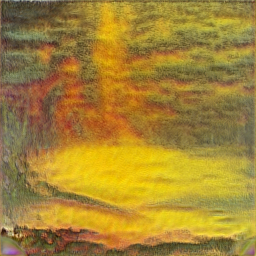

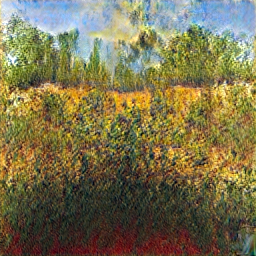

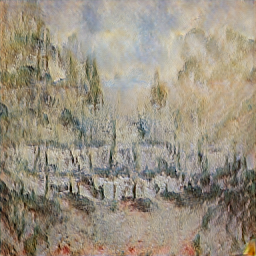

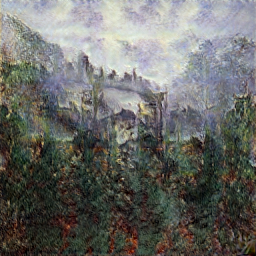

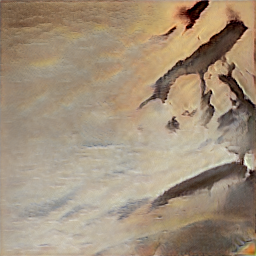

...

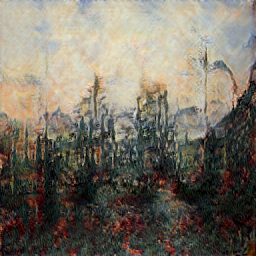

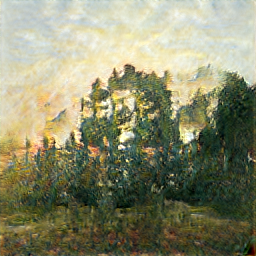

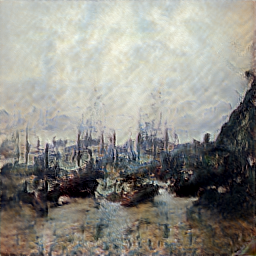

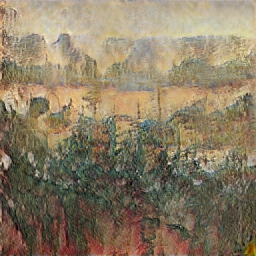

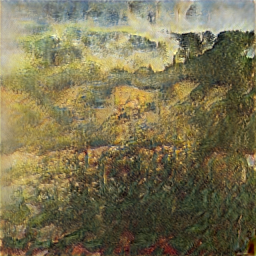

In [5]:
from google.colab.patches import cv2_imshow
from glob import glob
import cv2

for file in glob('/content/StyleGan_FewShot/output/monet_reduced/*.*'):
  img = cv2.imread(file, cv2.IMREAD_UNCHANGED)
  cv2_imshow(img) 

View training dashboards such as scalars, graphs, histograms, and others result, using TensorBoard.

In [6]:
%load_ext tensorboard
%tensorboard --logdir=/content/StyleGan_FewShot/monet  --port 6006

<IPython.core.display.Javascript object>